In [ ]:
# Predict house pricing using advanced regression

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from sklearn.linear_model import LinearRegression,Ridge,Lasso,ElasticNet
from sklearn.ensemble import GradientBoostingRegressor,RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

In [ ]:
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

In [ ]:
df1= pd.read_csv('train.csv')
df2= pd.read_csv('test.csv')

In [ ]:
df1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [ ]:
df2.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [ ]:
df1.shape,df2.shape

((1460, 81), (1459, 80))

In [ ]:
df=pd.concat([df1,df2])

In [ ]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0


In [ ]:
df.shape

(2919, 81)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2919 entries, 0 to 1458
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             2919 non-null   int64  
 1   MSSubClass     2919 non-null   int64  
 2   MSZoning       2915 non-null   object 
 3   LotFrontage    2433 non-null   float64
 4   LotArea        2919 non-null   int64  
 5   Street         2919 non-null   object 
 6   Alley          198 non-null    object 
 7   LotShape       2919 non-null   object 
 8   LandContour    2919 non-null   object 
 9   Utilities      2917 non-null   object 
 10  LotConfig      2919 non-null   object 
 11  LandSlope      2919 non-null   object 
 12  Neighborhood   2919 non-null   object 
 13  Condition1     2919 non-null   object 
 14  Condition2     2919 non-null   object 
 15  BldgType       2919 non-null   object 
 16  HouseStyle     2919 non-null   object 
 17  OverallQual    2919 non-null   int64  
 18  OverallCond  

In [ ]:
df.isnull().sum().sort_values(ascending=False)

,0
PoolQC,2909
MiscFeature,2814
Alley,2721
Fence,2348
MasVnrType,1766
SalePrice,1459
FireplaceQu,1420
LotFrontage,486
GarageYrBlt,159
GarageFinish,159


Boş verileri doldurma-Amputation
1-Mean - ortalama ile doldurma
2-Median - orta değer ile doldurma
3-KNN - iki komşu verinin benzerliği ile
4-Regression -
5-F-forward - büyükten küçüğe sıralayıp sıralı değere göre
6-Backward
7-WEKA - en çok tekrar eden veri ile

In [ ]:
df.drop(['Id'],axis=1, inplace=True)

In [ ]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0


In [ ]:
df.shape

(2919, 80)

In [ ]:
df.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'Wo

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,2919.0,57.137718,42.517628,20.0,20.0,50.0,70.0,190.0
LotFrontage,2433.0,69.305795,23.344905,21.0,59.0,68.0,80.0,313.0
LotArea,2919.0,10168.114080,7886.996359,1300.0,7478.0,9453.0,11570.0,215245.0
OverallQual,2919.0,6.089072,1.409947,1.0,5.0,6.0,7.0,10.0
OverallCond,2919.0,5.564577,1.113131,1.0,5.0,5.0,6.0,9.0
YearBuilt,2919.0,1971.312778,30.291442,1872.0,1953.5,1973.0,2001.0,2010.0
YearRemodAdd,2919.0,1984.264474,20.894344,1950.0,1965.0,1993.0,2004.0,2010.0
MasVnrArea,2896.0,102.201312,179.334253,0.0,0.0,0.0,164.0,1600.0
BsmtFinSF1,2918.0,441.423235,455.610826,0.0,0.0,368.5,733.0,5644.0
BsmtFinSF2,2918.0,49.582248,169.205611,0.0,0.0,0.0,0.0,1526.0


In [ ]:
df.corr(numeric_only=True)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.417359,-0.201730,0.033638,-0.065625,0.034409,0.043315,0.005433,-0.064311,-0.072530,-0.125994,-0.219965,-0.248641,0.309309,0.026482,0.071677,0.009950,-0.001878,0.139140,0.178750,-0.008796,0.260155,0.040509,-0.055151,0.087898,-0.046597,-0.103394,-0.017654,-0.015923,-0.020867,-0.037529,-0.049181,-0.003080,-0.028867,-0.001231,-0.015028,-0.084284
LotFrontage,-0.417359,1.000000,0.489896,0.217645,-0.075508,0.122811,0.091557,0.221079,0.219408,0.047431,0.113714,0.354822,0.458247,0.026545,0.004894,0.382462,0.113245,-0.025629,0.181668,0.039452,0.234892,0.004676,0.349513,0.261970,0.076673,0.310587,0.359786,0.122070,0.164896,0.011509,0.028289,0.075858,0.174119,0.044272,0.011254,-0.007917,0.351799
LotArea,-0.201730,0.489896,1.000000,0.100541,-0.035617,0.024128,0.021612,0.125596,0.194031,0.084059,0.021362,0.254138,0.332460,0.031515,0.000554,0.284519,0.128349,0.026292,0.125826,0.034244,0.132801,-0.020854,0.213802,0.261185,-0.008628,0.180434,0.213251,0.158045,0.104797,0.020974,0.015995,0.054375,0.093708,0.069029,0.004156,-0.024234,0.263843
OverallQual,0.033638,0.217645,0.100541,1.000000,-0.093847,0.597554,0.571532,0.432947,0.281810,-0.042771,0.275175,0.549294,0.479152,0.245596,-0.048393,0.575126,0.164543,-0.040732,0.528483,0.272668,0.073075,-0.159325,0.389761,0.390753,0.571803,0.600744,0.565122,0.255317,0.298084,-0.139256,0.018715,0.042910,0.030740,0.005562,0.030405,-0.019614,0.790982
OverallCond,-0.065625,-0.075508,-0.035617,-0.093847,1.000000,-0.368477,0.047654,-0.136007,-0.050418,0.041501,-0.138202,-0.174002,-0.157418,0.005494,0.009048,-0.116569,-0.042133,0.084181,-0.215504,-0.088577,-0.008477,-0.086700,-0.092027,-0.030999,-0.325849,-0.181787,-0.154149,0.020123,-0.068978,0.071044,0.043739,0.043713,-0.016876,0.033956,-0.006256,0.030102,-0.077856
YearBuilt,0.034409,0.122811,0.024128,0.597554,-0.368477,1.000000,0.612235,0.314051,0.279581,-0.027595,0.130473,0.408515,0.310814,0.017588,-0.144191,0.242666,0.211580,-0.030282,0.471169,0.269743,-0.053101,-0.137614,0.114280,0.170680,0.834812,0.538074,0.480735,0.229426,0.198554,-0.374073,0.015958,-0.041046,0.002304,-0.010886,0.013938,-0.012344,0.522897
YearRemodAdd,0.043315,0.091557,0.021612,0.571532,0.047654,0.612235,1.000000,0.196875,0.152126,-0.062153,0.165175,0.298107,0.242245,0.158985,-0.060371,0.316972,0.134947,-0.046285,0.457980,0.211430,-0.021912,-0.142431,0.198250,0.134157,0.652365,0.426022,0.376765,0.218513,0.242182,-0.220456,0.037433,-0.046878,-0.011407,-0.003124,0.017693,0.033203,0.507101
MasVnrArea,0.005433,0.221079,0.125596,0.432947,-0.136007,0.314051,0.196875,1.000000,0.303490,-0.015645,0.090163,0.397240,0.395834,0.121014,-0.057912,0.402994,0.141593,0.015006,0.259777,0.191950,0.078126,-0.051389,0.278228,0.275195,0.255112,0.361190,0.374061,0.166200,0.144650,-0.111499,0.013612,0.065209,0.004512,0.044811,-0.000117,-0.018510,0.477493
BsmtFinSF1,-0.064311,0.219408,0.194031,0.281810,-0.050418,0.279581,0.152126,0.303490,1.000000,-0.055045,-0.477404,0.536467,0.458092,-0.162301,-0.066028,0.211669,0.638847,0.078361,0.081525,-0.007311,-0.113547,-0.086354,0.052141,0.293089,0.194270,0.255482,0.310449,0.223492,0.124163,-0.099712,0.050908,0.096823,0.084462,0.093295,-0.000942,0.022556,0.386420
BsmtFinSF2,-0.072530,0.047431,0.084059,-0.042771,0.041501,-0.027595,-0.062153,-0.015645,-0.055045,1.000000,-0.238241,0.089410,0.084330,-0.097744,-0.004923,-0.017872,0.162835,0.099485,-0.075432,-0.032448,-0.031223,-0.037779,-0.048423,0.065625,-0.068549,-0.014827,0.003139,0.098399,-0.005876,0.032740,-0.023279,0.063302,0.044524,-0.005139,-0.009593,0.008883,-0.011378


In [ ]:
abs(df.corr(numeric_only=True)['SalePrice']).sort_values(ascending=False)

,SalePrice
SalePrice,1.000000
OverallQual,0.790982
GrLivArea,0.708624
GarageCars,0.640409
GarageArea,0.623431
TotalBsmtSF,0.613581
1stFlrSF,0.605852
FullBath,0.560664
TotRmsAbvGrd,0.533723
YearBuilt,0.522897


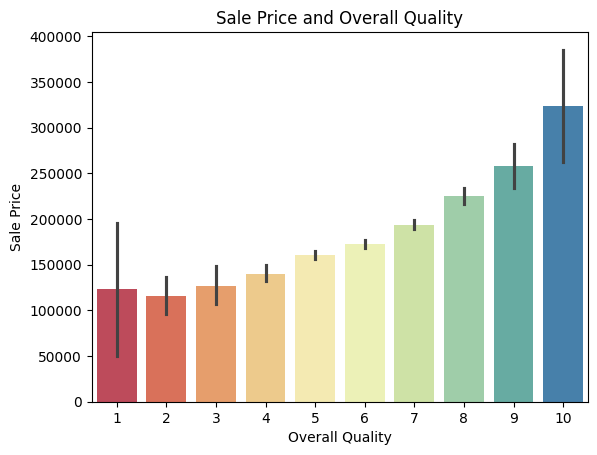

In [ ]:
sns.barplot(x='OverallQual', y='SalePrice', data=df, palette='Spectral')
plt.title('Sale Price and Overall Quality')
plt.xlabel('Overall Quality')
plt.ylabel('Sale Price');

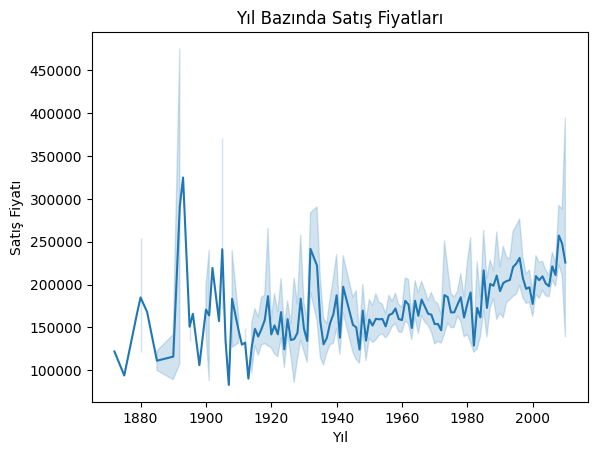

In [ ]:
sns.lineplot(x='YearBuilt', y='SalePrice', data=df)
plt.title('Yıl Bazında Satış Fiyatları')
plt.xlabel('Yıl')
plt.ylabel('Satış Fiyatı')
plt.show()

In [ ]:
# Object verilerin label encoder yardımıyla sayısal verilere çevrilmesi ve bunların hangi sayılara karşılık geldiğini görme.

In [ ]:
from sklearn.preprocessing import LabelEncoder
#LabelEncoder, kategorik verileri sayısal verilere dönüştürmek için kullanılır.

le_dict = {}  # Sınıf-değer eşleşmelerini saklamak için bir sözlük oluşturun
le = LabelEncoder()

for column in df.columns:
    if df[column].dtype == 'object':
        valid_values = df[column].dropna().unique() #column: Bu, üzerinde işlem yapılacak sütunun adını temsil eder. Örneğin, column "A" ise, df[column] ifadesi "A" sütunundaki verilere erişir.
        le.fit(valid_values)                        #dropna():Bu yöntem, serideki veya veri çerçevesindeki eksik (NaN) değerleri kaldırır.Yani, "A" sütunundaki dolu hücrelerden sadece farklı olanları alır ve tekrar eden değerleri yalnızca bir kere listeler.
        le_dict[column] = dict(zip(le.classes_, le.transform(le.classes_))) #le_dict[column] ifadesi, belirli bir sütundaki kategorik değerlerin sayısal karşılıklarını saklayan bir sözlük haline gelir.
        df[column] = df[column].apply(lambda x: le.transform([x])[0] if pd.notna(x) else x)
        #veri çerçevesindeki belirtilen sütundaki her bir değer, sayısal karşılığı ile değiştirilir, NaN olanlar ise olduğu gibi bırakılır.

#le.classes_: LabelEncoder kullanıldığında, bu özellik o sütundaki tüm benzersiz kategorik değerleri içerir. Örneğin, ["Kırmızı", "Mavi", "Yeşil"] gibi bir liste döndürür.
#le.transform(le.classes_): Bu metod, le.classes_ içindeki her bir kategorik değeri sayısal bir değere dönüştürür. Örneğin, ["Kırmızı", "Mavi", "Yeşil"] değerlerini [0, 1, 2] olarak dönüştürebilir.
#zip(...): Bu işlev, iki listeyi birleştirerek çiftler oluşturur.


# Sınıf-değer eşleşmelerini yazdırın
for col, mapping in le_dict.items():
    print(f"Column '{col}':")
    for class_name, value in mapping.items():
        print(f"  {class_name} -> {value}")

#le_dict.items(): Bu yöntem, le_dict içindeki her bir anahtar-değer çiftini döndürür. col, o anki sütunun adını (anahtar), mapping ise o sütundaki kategorik değerlerin sayısal karşılıklarını tutan sözlüğü (değer) temsil eder.
#mapping.items(): Bu, mapping içindeki her bir kategorik değeri (anahtar) ve onun sayısal karşılığını (değer) döndürür.
#class_name: Kategorik değeri temsil eder. Örneğin, "Kırmızı", "Mavi", "Yeşil".
#value: Bu kategorik değerin sayısal karşılığıdır. Örneğin, 0, 1, 2.

Column 'MSZoning':
  C (all) -> 0
  FV -> 1
  RH -> 2
  RL -> 3
  RM -> 4
Column 'Street':
  Grvl -> 0
  Pave -> 1
Column 'Alley':
  Grvl -> 0
  Pave -> 1
Column 'LotShape':
  IR1 -> 0
  IR2 -> 1
  IR3 -> 2
  Reg -> 3
Column 'LandContour':
  Bnk -> 0
  HLS -> 1
  Low -> 2
  Lvl -> 3
Column 'Utilities':
  AllPub -> 0
  NoSeWa -> 1
Column 'LotConfig':
  Corner -> 0
  CulDSac -> 1
  FR2 -> 2
  FR3 -> 3
  Inside -> 4
Column 'LandSlope':
  Gtl -> 0
  Mod -> 1
  Sev -> 2
Column 'Neighborhood':
  Blmngtn -> 0
  Blueste -> 1
  BrDale -> 2
  BrkSide -> 3
  ClearCr -> 4
  CollgCr -> 5
  Crawfor -> 6
  Edwards -> 7
  Gilbert -> 8
  IDOTRR -> 9
  MeadowV -> 10
  Mitchel -> 11
  NAmes -> 12
  NPkVill -> 13
  NWAmes -> 14
  NoRidge -> 15
  NridgHt -> 16
  OldTown -> 17
  SWISU -> 18
  Sawyer -> 19
  SawyerW -> 20
  Somerst -> 21
  StoneBr -> 22
  Timber -> 23
  Veenker -> 24
Column 'Condition1':
  Artery -> 0
  Feedr -> 1
  Norm -> 2
  PosA -> 3
  PosN -> 4
  RRAe -> 5
  RRAn -> 6
  RRNe -> 7
  RRNn

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2919 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     2919 non-null   int64  
 1   MSZoning       2919 non-null   float64
 2   LotFrontage    2919 non-null   float64
 3   LotArea        2919 non-null   int64  
 4   Street         2919 non-null   int64  
 5   Alley          2919 non-null   float64
 6   LotShape       2919 non-null   int64  
 7   LandContour    2919 non-null   int64  
 8   Utilities      2919 non-null   float64
 9   LotConfig      2919 non-null   int64  
 10  LandSlope      2919 non-null   int64  
 11  Neighborhood   2919 non-null   int64  
 12  Condition1     2919 non-null   int64  
 13  Condition2     2919 non-null   int64  
 14  BldgType       2919 non-null   int64  
 15  HouseStyle     2919 non-null   int64  
 16  OverallQual    2919 non-null   int64  
 17  OverallCond    2919 non-null   int64  
 18  YearBuilt    

In [ ]:
df.fillna(df.mean(),inplace=True)

#inplace=True: Bu parametre, değişikliklerin doğrudan mevcut DataFrame üzerinde yapılmasını sağlar. Yani, yeni bir DataFrame oluşturmak yerine, df üzerinde güncelleme yapılır.
#Boş olan değerlerin hepsini ortalama ile doldurduk

In [ ]:
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,3.000000,65.000000,8450,1,0.393939,3,3,0.000000,4,0,5,2,2,0,5,7,5,2003,2003,1,1,12.000000,13.000000,1.000000,196.000000,2,4,2,2.000000,3.000000,3.000000,2.000000,706.000000,5.000000,0.000000,150.000000,856.000000,1,0,1,4.000000,856,854,0,1710,1.000000,0.000000,2,1,3,1,2.000000,8,6.000000,0,2.713809,1.000000,2003.000000,1.000000,2.000000,548.000000,4.000000,4.000000,2,0,61,0,0,0,0,1.0,1.411559,1.87619,0,2,2008,8.00000,4,208500.00000
1,20,3.000000,80.000000,9600,1,0.393939,3,3,0.000000,2,0,24,1,2,0,2,6,8,1976,1976,1,1,8.000000,8.000000,1.194276,0.000000,3,4,1,2.000000,3.000000,1.000000,0.000000,978.000000,5.000000,0.000000,284.000000,1262.000000,1,0,1,4.000000,1262,0,0,1262,0.000000,1.000000,2,0,3,1,3.000000,6,6.000000,1,4.000000,1.000000,1976.000000,1.000000,2.000000,460.000000,4.000000,4.000000,2,298,0,0,0,0,0,1.0,1.411559,1.87619,0,5,2007,8.00000,4,181500.00000
2,60,3.000000,68.000000,11250,1,0.393939,0,3,0.000000,4,0,5,2,2,0,5,7,5,2001,2002,1,1,12.000000,13.000000,1.000000,162.000000,2,4,2,2.000000,3.000000,2.000000,2.000000,486.000000,5.000000,0.000000,434.000000,920.000000,1,0,1,4.000000,920,866,0,1786,1.000000,0.000000,2,1,3,1,2.000000,6,6.000000,1,4.000000,1.000000,2001.000000,1.000000,2.000000,608.000000,4.000000,4.000000,2,0,42,0,0,0,0,1.0,1.411559,1.87619,0,9,2008,8.00000,4,223500.00000
3,70,3.000000,60.000000,9550,1,0.393939,0,3,0.000000,0,0,6,2,2,0,5,7,5,1915,1970,1,1,13.000000,15.000000,1.194276,0.000000,3,4,0,3.000000,1.000000,3.000000,0.000000,216.000000,5.000000,0.000000,540.000000,756.000000,1,2,1,4.000000,961,756,0,1717,1.000000,0.000000,1,0,3,1,2.000000,7,6.000000,1,2.000000,5.000000,1998.000000,2.000000,3.000000,642.000000,4.000000,4.000000,2,0,35,272,0,0,0,1.0,1.411559,1.87619,0,2,2006,8.00000,0,140000.00000
4,60,3.000000,84.000000,14260,1,0.393939,0,3,0.000000,2,0,15,2,2,0,5,8,5,2000,2000,1,1,12.000000,13.000000,1.000000,350.000000,2,4,2,2.000000,3.000000,0.000000,2.000000,655.000000,5.000000,0.000000,490.000000,1145.000000,1,0,1,4.000000,1145,1053,0,2198,1.000000,0.000000,2,1,4,1,2.000000,9,6.000000,1,4.000000,1.000000,2000.000000,1.000000,3.000000,836.000000,4.000000,4.000000,2,192,84,0,0,0,0,1.0,1.411559,1.87619,0,12,2008,8.00000,4,250000.00000
5,50,3.000000,85.000000,14115,1,0.393939,0,3,0.000000,4,0,11,2,2,0,0,5,5,1993,1995,1,1,12.000000,13.000000,1.194276,0.000000,3,4,5,2.000000,3.000000,3.000000,2.000000,732.000000,5.000000,0.000000,64.000000,796.000000,1,0,1,4.000000,796,566,0,1362,1.000000,0.000000,1,1,1,1,3.000000,5,6.000000,0,2.713809,1.000000,1993.000000,2.000000,2.000000,480.000000,4.000000,4.000000,2,40,30,0,320,0,0,1.0,2.000000,2.00000,700,10,2009,8.00000,4,143000.00000
6,20,3.000000,75.000000,10084,1,0.393939,3,3,0.000000,4,0,21,2,2,0,2,8,5,2004,2005,1,1,12.000000,13.000000,2.000000,186.000000,2,4,2,0.000000,3.000000,0.000000,2.000000,1369.000000,5.000000,0.000000,317.000000,1686.000000,1,0,1,4.000000,1694,0,0,1694,1.000000,0.000000,2,0,3,1,2.000000,7,6.000000,1,2.000000,1.000000,2004.000000,1.000000,2.000000,636.000000,4.000000,4.000000,2,255,57,0,0,0,0,1.0,1.411559,1.87619,0,8,2007,8.00000,4,307000.00000
7,60,3.000000,69.305795,10382,1,0.393939,0,

In [ ]:
df.isnull().sum().sort_values(ascending=False)

,0
MSSubClass,0
MSZoning,0
GarageYrBlt,0
GarageType,0
FireplaceQu,0
Fireplaces,0
Functional,0
TotRmsAbvGrd,0
KitchenQual,0
KitchenAbvGr,0


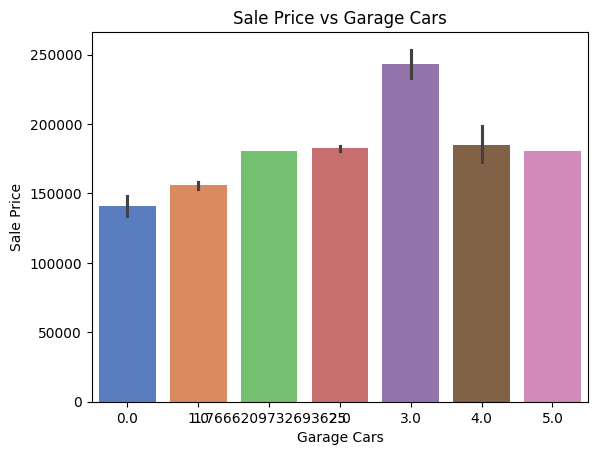

In [ ]:
sns.barplot(x='GarageCars', y='SalePrice', data=df, palette='muted')
plt.title('Sale Price vs Garage Cars')
plt.xlabel('Garage Cars')
plt.ylabel('Sale Price');

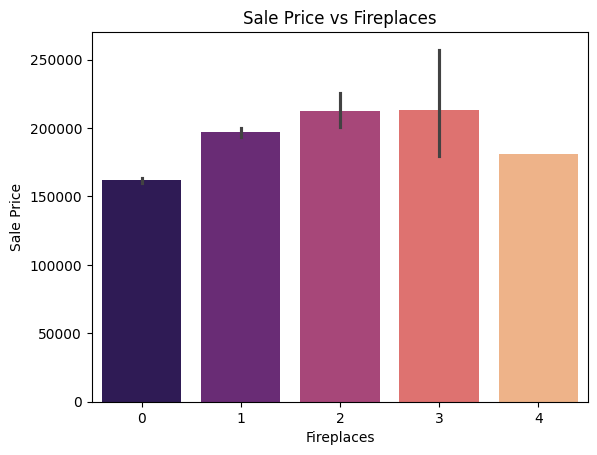

In [ ]:
sns.barplot(x='Fireplaces', y='SalePrice', data=df, palette='magma')
plt.title('Sale Price vs Fireplaces')
plt.xlabel('Fireplaces')
plt.ylabel('Sale Price');

In [ ]:
df.to_csv('data.csv',index=False)

In [ ]:
train=df[:1460]
test=df[1460:]

In [ ]:
train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,3.0,65.0,8450,1,0.393939,3,3,0.0,4,0,5,2,2,0,5,7,5,2003,2003,1,1,12.0,13.0,1.000000,196.0,2,4,2,2.0,3.0,3.0,2.0,706.0,5.0,0.0,150.0,856.0,1,0,1,4.0,856,854,0,1710,1.0,0.0,2,1,3,1,2.0,8,6.0,0,2.713809,1.0,2003.0,1.0,2.0,548.0,4.0,4.0,2,0,61,0,0,0,0,1.0,1.411559,1.87619,0,2,2008,8.0,4,208500.0
1,20,3.0,80.0,9600,1,0.393939,3,3,0.0,2,0,24,1,2,0,2,6,8,1976,1976,1,1,8.0,8.0,1.194276,0.0,3,4,1,2.0,3.0,1.0,0.0,978.0,5.0,0.0,284.0,1262.0,1,0,1,4.0,1262,0,0,1262,0.0,1.0,2,0,3,1,3.0,6,6.0,1,4.000000,1.0,1976.0,1.0,2.0,460.0,4.0,4.0,2,298,0,0,0,0,0,1.0,1.411559,1.87619,0,5,2007,8.0,4,181500.0
2,60,3.0,68.0,11250,1,0.393939,0,3,0.0,4,0,5,2,2,0,5,7,5,2001,2002,1,1,12.0,13.0,1.000000,162.0,2,4,2,2.0,3.0,2.0,2.0,486.0,5.0,0.0,434.0,920.0,1,0,1,4.0,920,866,0,1786,1.0,0.0,2,1,3,1,2.0,6,6.0,1,4.000000,1.0,2001.0,1.0,2.0,608.0,4.0,4.0,2,0,42,0,0,0,0,1.0,1.411559,1.87619,0,9,2008,8.0,4,223500.0
3,70,3.0,60.0,9550,1,0.393939,0,3,0.0,0,0,6,2,2,0,5,7,5,1915,1970,1,1,13.0,15.0,1.194276,0.0,3,4,0,3.0,1.0,3.0,0.0,216.0,5.0,0.0,540.0,756.0,1,2,1,4.0,961,756,0,1717,1.0,0.0,1,0,3,1,2.0,7,6.0,1,2.000000,5.0,1998.0,2.0,3.0,642.0,4.0,4.0,2,0,35,272,0,0,0,1.0,1.411559,1.87619,0,2,2006,8.0,0,140000.0
4,60,3.0,84.0,14260,1,0.393939,0,3,0.0,2,0,15,2,2,0,5,8,5,2000,2000,1,1,12.0,13.0,1.000000,350.0,2,4,2,2.0,3.0,0.0,2.0,655.0,5.0,0.0,490.0,1145.0,1,0,1,4.0,1145,1053,0,2198,1.0,0.0,2,1,4,1,2.0,9,6.0,1,4.000000,1.0,2000.0,1.0,3.0,836.0,4.0,4.0,2,192,84,0,0,0,0,1.0,1.411559,1.87619,0,12,2008,8.0,4,250000.0


In [ ]:
test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,20,2.0,80.0,11622,1,0.393939,3,3,0.0,4,0,12,1,2,0,2,5,6,1961,1961,1,1,12.0,13.0,1.194276,0.0,3,4,1,3.0,3.0,3.0,4.0,468.0,3.0,144.0,270.0,882.0,1,4,1,4.0,896,0,0,896,0.0,0.0,1,0,2,1,3.0,5,6.0,0,2.713809,1.0,1961.0,2.0,1.0,730.0,4.0,4.0,2,140,0,0,0,120,0,1.0,2.000000,1.87619,0,6,2010,8.0,4,180921.19589
1,20,3.0,81.0,14267,1,0.393939,0,3,0.0,0,0,12,2,2,0,2,6,6,1958,1958,3,1,13.0,14.0,1.000000,108.0,3,4,1,3.0,3.0,3.0,0.0,923.0,5.0,0.0,406.0,1329.0,1,4,1,4.0,1329,0,0,1329,0.0,0.0,1,1,3,1,2.0,6,6.0,0,2.713809,1.0,1958.0,2.0,1.0,312.0,4.0,4.0,2,393,36,0,0,0,0,1.0,1.411559,0.00000,12500,6,2010,8.0,4,180921.19589
2,60,3.0,74.0,13830,1,0.393939,0,3,0.0,4,0,8,2,2,0,5,5,5,1997,1998,1,1,12.0,13.0,1.194276,0.0,3,4,2,2.0,3.0,3.0,2.0,791.0,5.0,0.0,137.0,928.0,1,2,1,4.0,928,701,0,1629,0.0,0.0,2,1,3,1,3.0,6,6.0,1,4.000000,1.0,1997.0,0.0,2.0,482.0,4.0,4.0,2,212,34,0,0,0,0,1.0,2.000000,1.87619,0,3,2010,8.0,4,180921.19589
3,60,3.0,78.0,9978,1,0.393939,0,3,0.0,4,0,8,2,2,0,5,6,6,1998,1998,1,1,12.0,13.0,1.000000,20.0,3,4,2,3.0,3.0,3.0,2.0,602.0,5.0,0.0,324.0,926.0,1,0,1,4.0,926,678,0,1604,0.0,0.0,2,1,3,1,2.0,7,6.0,1,2.000000,1.0,1998.0,0.0,2.0,470.0,4.0,4.0,2,360,36,0,0,0,0,1.0,1.411559,1.87619,0,6,2010,8.0,4,180921.19589
4,120,3.0,43.0,5005,1,0.393939,0,1,0.0,4,0,22,2,2,4,2,8,5,1992,1992,1,1,6.0,6.0,1.194276,0.0,2,4,2,2.0,3.0,3.0,0.0,263.0,5.0,0.0,1017.0,1280.0,1,0,1,4.0,1280,0,0,1280,0.0,0.0,2,0,2,1,2.0,5,6.0,0,2.713809,1.0,1992.0,1.0,2.0,506.0,4.0,4.0,2,0,82,0,0,144,0,1.0,1.411559,1.87619,0,1,2010,8.0,4,180921.19589


In [ ]:
x=train.drop('SalePrice',axis=1)
y=train['SalePrice']

In [ ]:
del test['SalePrice']

In [ ]:
test.sample()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
472,60,3.0,70.0,10457,1,0.393939,0,3,0.0,4,1,11,2,2,0,5,5,7,1969,1969,1,1,12.0,13.0,1.0,178.0,2,0,1,3.0,3.0,1.0,1.0,496.0,3.0,288.0,0.0,784.0,1,0,1,4.0,784,848,0,1632,0.0,0.0,1,1,4,1,3.0,7,6.0,1,4.0,1.0,1969.0,1.0,2.0,898.0,4.0,4.0,2,0,173,368,0,0,0,1.0,2.0,1.87619,0,4,2009,8.0,4


In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=42)

In [ ]:
R=Ridge()
R.fit(x_train,y_train)
tahmin=R.predict(x_test)
rmse=(mean_squared_error(y_test,tahmin))**0.5
r2=r2_score(y_test,tahmin)


print('Root Mean Squared Error:', rmse)
print('R2 Score:', r2)

Root Mean Squared Error: 34998.74178365435
R2 Score: 0.8403051065427745


In [ ]:
L=Lasso()
L.fit(x_train,y_train)
tahmin2=L.predict(x_test)
rmse=(mean_squared_error(y_test,tahmin2))**0.5
r2=r2_score(y_test,tahmin2)


print('Root Mean Squared Error:', rmse)
print('R2 Score:', r2)

Root Mean Squared Error: 35636.42871863193
R2 Score: 0.8344327193505563


In [ ]:
E=ElasticNet()
E.fit(x_train,y_train)
tahmin2=E.predict(x_test)
r2_score(tahmin2,y_test)
(mean_squared_error(tahmin2,y_test))**0.5

print('Root Mean Squared Error:', rmse)
print('R2 Score:', r2)

Root Mean Squared Error: 35636.42871863193
R2 Score: 0.8344327193505563


In [ ]:
lr=LinearRegression()
lr.fit(x_train, y_train)
tahmin3=lr.predict(x_test)
r2=r2_score(y_test, tahmin3)
rmse=mean_squared_error(y_test, tahmin3)**.5


print('Root Mean Squared Error:', rmse)
print('R2 Score:', r2)

Root Mean Squared Error: 35642.30915070615
R2 Score: 0.8343780737246657


In [ ]:
Gr=GradientBoostingRegressor()
Gr.fit(x_train,y_train)
tahmin4=Gr.predict(x_test)
r2_score(tahmin4,y_test)
(mean_squared_error(tahmin4,y_test))**0.5

print('Root Mean Squared Error:', rmse)
print('R2 Score:', r2)

Root Mean Squared Error: 35642.30915070615
R2 Score: 0.8343780737246657


In [ ]:
Rd=RandomForestRegressor()
Rd.fit(x_train,y_train)
tahmin5=Rd.predict(x_test)
r2_score(tahmin5,y_test)
(mean_squared_error(tahmin5,y_test))**0.5

print('Root Mean Squared Error:', rmse)
print('R2 Score:', r2)

Root Mean Squared Error: 35642.30915070615
R2 Score: 0.8343780737246657


In [ ]:
from sklearn.tree import ExtraTreeRegressor

In [ ]:
Ex=ExtraTreeRegressor()
Ex.fit(x_train,y_train)
tahmin6=Ex.predict(x_test)
r2_score(tahmin6,y_test)
(mean_squared_error(tahmin6,y_test))**0.5

print('Root Mean Squared Error:', rmse)
print('R2 Score:', r2)

Root Mean Squared Error: 35642.30915070615
R2 Score: 0.8343780737246657


### Feature Importance

In [ ]:
feature_importance=pd.DataFrame({'Feature':x_train.columns, 'Coefs':R.coef_[0]})

In [ ]:
feature_importance=feature_importance.sort_values(by='Coefs', ascending=False)

In [ ]:
feature_importance

,Feature,Coefs
0,MSSubClass,-113.047773
50,BedroomAbvGr,-113.047773
57,GarageType,-113.047773
56,FireplaceQu,-113.047773
55,Fireplaces,-113.047773
54,Functional,-113.047773
53,TotRmsAbvGrd,-113.047773
52,KitchenQual,-113.047773
51,KitchenAbvGr,-113.047773
49,HalfBath,-113.047773


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_columns",100)

from sklearn.linear_model import LinearRegression,SGDRegressor,Ridge,Lasso,ElasticNet
from sklearn.neighbors import KNeighborsRegressor, RadiusNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor,AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor, plot_tree, ExtraTreeRegressor
from sklearn.ensemble import RandomForestRegressor
#pip install xgboost
from xgboost import XGBRegressor
from sklearn.svm import SVR

from sklearn.neural_network import MLPRegressor

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error

from sklearn.preprocessing import StandardScaler


def algo_test(x,y):

        L=LinearRegression()
        RF=RandomForestRegressor()
        R=Ridge()
        Lass=Lasso()
        E=ElasticNet()
        sgd=SGDRegressor()
        ETR=ExtraTreeRegressor()
        GBR=GradientBoostingRegressor()
        kn=KNeighborsRegressor()
        rkn=RadiusNeighborsRegressor(radius=1.0)
        ada=AdaBoostRegressor()
        dt=DecisionTreeRegressor()
        xgb=XGBRegressor()
        svr=SVR()
        mlp_regressor = MLPRegressor()



        algos=[L,RF,R,Lass,E,sgd,ETR,GBR,ada,kn,dt,xgb,svr,mlp_regressor]
        algo_names=['Linear','RandomForest','Ridge','Lasso','ElasticNet','SGD','Extra Tree','Gradient Boosting',
                    'KNeighborsRegressor','AdaBoost','Decision Tree','XGBRegressor','SVR','mlp_regressor']

        x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=.20,random_state=42)

        r_squared= []
        rmse= []
        mae= []


        result=pd.DataFrame(columns=['R_Squared','RMSE','MAE'],index=algo_names)


        for algo in algos:
            p=algo.fit(x_train,y_train).predict(x_test)
            r_squared.append(r2_score(y_test,p))
            rmse.append(mean_squared_error(y_test,p)**.5)
            mae.append(mean_absolute_error(y_test,p))



        result.R_Squared=r_squared
        result.RMSE=rmse
        result.MAE=mae


        rtable=result.sort_values('R_Squared',ascending=False)
        return rtable

In [ ]:
algo_test(x,y)

,R_Squared,RMSE,MAE
XGBRegressor,9.144608e-01,2.561471e+04,1.672832e+04
RandomForest,8.957389e-01,2.827926e+04,1.762862e+04
Gradient Boosting,8.822490e-01,3.005309e+04,1.745770e+04
ElasticNet,8.476614e-01,3.418314e+04,1.998032e+04
Ridge,8.403051e-01,3.499874e+04,2.124093e+04
KNeighborsRegressor,8.357987e-01,3.548912e+04,2.462212e+04
Lasso,8.344327e-01,3.563643e+04,2.135282e+04
Linear,8.343781e-01,3.564231e+04,2.135769e+04
Decision Tree,7.873588e-01,4.038598e+04,2.744731e+04
Extra Tree,7.407271e-01,4.459493e+04,2.730913e+04
